# 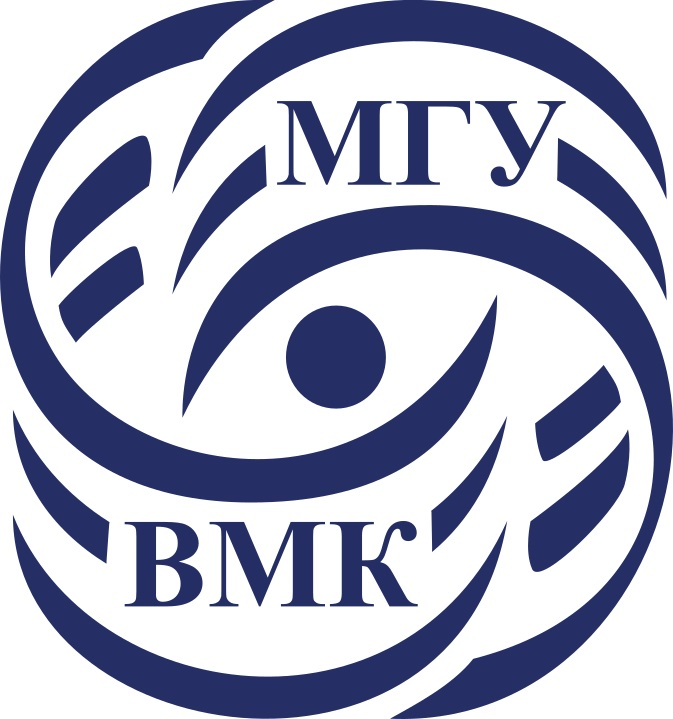

# Машинное обучение. ВМК МГУ

# Практическое задание 7: Кластеризация. Методы снижения размерности.
## Уровень: <font color='MediumSeaGreen'>**Исследовательский (Research)**</font>





# О формате сдачи

🔷 **<font color='plum'>При решении ноутбука используйте данный шаблон</font>**

    ✅ Можно добавлять новые ячейки любых типов
    ❌ Не нужно удалять текстовые ячейки c разметкой частей ноутбука и формулировками заданий


🔷 **<font color='plum'>При оценивании задач учитывается код</font>**

    ✅ Задания, в которых необходим код, обычно помечаются фразами "Your code here"/"Ваш код" и аналогичными
    ❌ Ответы на вопросы без сопутствующего кода оцениваются в 0 баллов
    ❌ Наличе работоспособного кода в ноутбуке, если на сказано иного, обязательно

🔷 **<font color='plum'>При оценивании задач учитываются выводы</font>**

    ✅ Задания, в которых необходимы выводы, обычно помечаются фразами Вывод"/"Ответ на вопрос"/"Ваш текст" и аналогичными
    ✅ Обычно выводы подразумевают под собой текстовый ответ (можно писать markdown, latex).
    ✅ Сопутствующие изображения, графики, таблички - приветствуются!
    ❌ При отсутствии выводов задание не засчитается на полный балл

-----------
<font color="white" style="opacity:0.2024"></font>







__В этом задании вы..:__

* Познакомитесь с одним способом визуализации процесса обучения
* Сравните между собой результаты разных способов кластеризации
* Посмотрите и реализуете несколько метрик качества кластеризации
* Попробуете разные методы снижения размерности

----

<font color="white" style="opacity:0.2024"></font>
<font color=DarkOrange>**Примерное время выполнения (execution time/время выполнения, если нажать run all) всех ячеек ноутбука при правильной реализации: 60 минут </font>**

----------------------------------------------
<font color="white" style="opacity:0.2023"></font>

Перед началом выполнения переведите ноутбук в `Доверенный режим` (`Trusted`) для корректного отображения изображений:

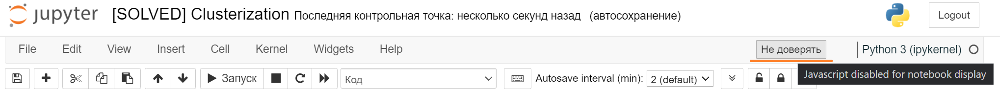

In [ ]:
%config Completer.use_jedi = False
%load_ext autoreload
%autoreload 2

----------------------------------------------
<font color="white" style="opacity:0.2023"></font>

# Подготовка рабочей среды

Сначала установим нужные нам версии библиотек. Мы гарантируем, что в данных версиях задание будет корректно отрабатывать.

После установки нужных версий, **возможно,** нужно перезагрузить среду (runtime), но скорее всего вам это не понадобится


На скачивание файла и установку понадобится не более 5 минут.

<font color='OrangeRed'>**Важно!**</font>

Устанавливать нужные версии нужно каждый раз, когда создается новый рантайм. Например, если вы 2 часа подряд делаете это задание, то подготовить библиотеки достаточно 1 раз. Но если вы, например, начали в понедельник, затем закрыли/выключили ноутбук, то при продолжении в среду, вам нужно будет запустить рантайм заново и следовательно заново установить библиотеки.

<font color='OrangeRed'>**Важно!**</font>
Если вы предпочитаете делать практические задания на своем личном ноутбуке, то проверьте, что вы установили рабочее окружение в [соответствии с гайдом](https://github.com/MSU-ML-COURSE/ML-COURSE-24-25/blob/main/tutorials/%D0%A2%D1%83%D1%82%D0%BE%D1%80%D0%B8%D0%B0%D0%BB%20%D0%BF%D0%BE%20%D1%83%D1%81%D1%82%D0%B0%D0%BD%D0%BE%D0%B2%D0%BA%D0%B5%20%D1%80%D0%B0%D0%B1%D0%BE%D1%87%D0%B5%D0%B3%D0%BE%20%D0%BE%D0%BA%D1%80%D1%83%D0%B6%D0%B5%D0%BD%D0%B8%D1%8F%20%D0%B2%20Python%20%D0%B4%D0%BB%D1%8F%20%D1%80%D0%B5%D1%88%D0%B5%D0%BD%D0%B8%D1%8F%20%D0%B7%D0%B0%D0%B4%D0%B0%D1%87%20(2).pdf)

-----

<font color='OrangeRed'>**Важно!**</font> В этом задании мы будем использовать полное виртуальное окружение, так как понадобятся библиотеки `torch` и `tensorflow`

Обратите внимание, что установка `torch` и `tensorflow` через `pip `может сломать ваше окружение, особенно если вы используете GPU. Выполняйте их установку в соответствии с Вашей конфигурацией системы или в отдельном виртуальном окружении

In [ ]:
! curl https://raw.githubusercontent.com/MSU-ML-COURSE/ML-COURSE-25-26/refs/heads/master/requirements/requirements.txt -o ./requirements_2025_26_for_colab_small.txt
! pip install -q -r ./requirements_2025_26_for_colab_small.txt

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   360  100   360    0     0   2175      0 --:--:-- --:--:-- --:--:--  2168
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 2.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.7/57.7 kB 1.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.2/99.2 MB 9.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.9/4.9 MB 92.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 515.7/515.7 kB 32.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.5/41.5 kB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 365.5/365.5 kB 25.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.2/35.2 MB 52.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.5/78.5 kB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.1/90

In [ ]:
import catboost
assert(catboost.__version__ == '1.2.8')

Теперь можно приступать к выполнению задания! :)

-----------
<font color="white" style="opacity:0.2024"></font>

# 1 О задании

В данной работе вам предстоит познакомится с методами машинного обучения без учителя — кластеризацией и алгоритмами снижения размерности.

Рекомендуется использовать Kaggle так как в нём корректно работают интерактивные визуализации.

Здесь перечислены основные функции и библиотеки, которые могут понадобиться Вам в процессе выполнения задания. Подключение других библиотек возможно, но нежелательно. **Работа каких-либо других библиотек не гарантируется.**

In [ ]:
import os

import gdown

import scipy

import numpy as np

import tqdm.auto as tqdm

import matplotlib
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

from ipywidgets import interactive, fixed, interact_manual, IntSlider, FloatLogSlider, FloatSlider

import torch
from torchvision.datasets import CIFAR10

# Необходима преварительная установка tensorflow
from keras.applications.inception_v3 import InceptionV3, preprocess_input

import sklearn

from sklearn.decomposition import KernelPCA
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering

# Библиотека umap-learn, а не umap
from umap import UMAP
from sklearn.manifold import TSNE, Isomap

from sklearn.model_selection import train_test_split
from sklearn.datasets import make_classification, make_moons, make_blobs
from sklearn.preprocessing import StandardScaler, MinMaxScaler

from warnings import simplefilter
from sklearn.exceptions import ConvergenceWarning
simplefilter("ignore", category=ConvergenceWarning)

Определим вспомогательную функцию для отрисовки двумерных кластеризованных данных. При выполенении задания желательно пользоваться этой функцией для визуализации. При необходимости можете менять сигнатуру и поведение функции как вам удобно, _оставляя стиль отрисовки в целом неизменным_.

In [ ]:
def plot_2d_data(data, labels, title='Исходные данные', cmap='tab20', ax=None):
    '''
    Отрисовка 2d scatter plot.
    :param np.ndarray data: 2d массив точек
    :param Union[list, np.ndarray] labels: список меток для каждой точки выборки
    :param str title: Заголовок графика
    :param str cmap: Цветовая палитра
    :param ax Optional[matplotlib.axes.Axes]: Оси для отрисовки графика.
        Если оси не заданы, то создаётся новая фигура и сразу же происходит её отрисовка
        Иначе, график добавляется на существуюущие оси. Отрисовки фигуры не происходит
    '''
    n_clusters = len(np.unique(labels))

    if ax is None:
        fig, ax = plt.subplots(1, 1, figsize=(10, 5))
    else:
        fig = None

    scatter = ax.scatter(
        data[:, 0], data[:, 1], c=labels,
        cmap=plt.get_cmap(cmap, n_clusters)
    )

    cbar = plt.colorbar(scatter, label='Номер кластера', ax=ax)
    cbar.set_ticks(np.min(labels) + (np.arange(n_clusters) + 0.5) * (n_clusters - 1) / n_clusters)
    cbar.set_ticklabels(np.unique(labels))

    ax.set_title(title)
    ax.grid(True)

    if fig is not None:
        fig.tight_layout()
        plt.show()

Также используйте написанные реализации из [Base] задания:

In [ ]:
def silhouette_score(x, labels):
    '''
    :param np.ndarray x: Непустой двумерный массив векторов-признаков
    :param np.ndarray labels: Непустой одномерный массив меток объектов
    :return float: Коэффициент силуэта для выборки x с метками labels
    '''

    _, inverse_labels, cluster_sizes = np.unique(
        labels,
        return_inverse=True,
        return_counts=True
    )
    n_objects = x.shape[0]
    n_clusters = cluster_sizes.shape[0]

    if n_clusters == 1:
        sil_score = 0.0
    else:
        distances = sklearn.metrics.pairwise_distances(x)

        order = np.argsort(inverse_labels)
        sorted_labels = inverse_labels[order]
        cluster_starts = np.concatenate((
            np.array([0]),
            np.flatnonzero(np.diff(sorted_labels)) + 1
        ))

        cluster_distances_sum = np.add.reduceat(
            distances[:, order],
            cluster_starts,
            axis=1
        )
        mean_distances = cluster_distances_sum / cluster_sizes

        same_cluster_distances = cluster_distances_sum[
            np.arange(n_objects),
            inverse_labels
        ]
        same_cluster_sizes = cluster_sizes[inverse_labels] - 1

        compactness = np.divide(
            same_cluster_distances,
            same_cluster_sizes,
            out=np.zeros(n_objects, dtype=float),
            where=same_cluster_sizes != 0
        )

        mean_distances[np.arange(n_objects), inverse_labels] = np.inf
        separation = np.min(mean_distances, axis=1)

        denominator = np.maximum(compactness, separation)
        silhouettes = np.divide(
            separation - compactness,
            denominator,
            out=np.zeros(n_objects, dtype=float),
            where=denominator != 0
        )
        silhouettes[cluster_sizes[inverse_labels] == 1] = 0.0

        sil_score = float(np.mean(silhouettes))

    return sil_score


def bcubed_score(true_labels, predicted_labels):
    '''
    :param np.ndarray true_labels: Непустой одномерный массив меток объектов
    :param np.ndarray predicted_labels: Непустой одномерный массив меток объектов
    :return float: B-Cubed для объектов с истинными метками true_labels и предсказанными метками predicted_labels
    '''

    same_true = true_labels[:, None] == true_labels[None, :]
    same_predicted = predicted_labels[:, None] == predicted_labels[None, :]
    same_both = same_true & same_predicted

    precision = np.mean(
        same_both.sum(axis=1) / same_predicted.sum(axis=1)
    )
    recall = np.mean(
        same_both.sum(axis=1) / same_true.sum(axis=1)
    )

    score = 2 * precision * recall / (precision + recall)

    return score

## 1.1 Ещё несколько важных замечаний

При выполнении задания запрещено:
1. Менять те seed, которые явно указаны в коде
2. Менять прототипы функций, классов, методов классов
3. Менять константы, используемые для генерации выборок

При оформлении задания обратите внимание на форматирование кода и на оформление графиков:

* Весь код должен быть оформлен в строгом соответствии с [PEP8](https://pep8.org/)

Графики должны быть с одной стороны понятными и информативными, а с другой стороны *красивыми*. Вот несколько пунктов, которые помогут удовлетворить этим требования:
1. Все графики должны быть отрисованы в **векторном формате**. Обратите внимание, что смена режима графиков с динамического на статический и обратно может приводить к сбросу параметров отрисовки графиков. Переход в векторный режим можно выполнить с помощью команды `matplotlib_inline.backend_inline.set_matplotlib_formats('pdf', 'svg')`. Если изображения в векторном формате приводят к слишком большому размеру Jupyter Notebook можете использовать растровые изображения с **высоким dpi**. Напирмер, можно установить глобальный dpi в matplotlib: `matplotlib.rcParams['figure.dpi'] = 300`
2. На всех графиках без исключения должна быть нарисована сетка
3. Все графики и группы графиков должны иметь заголовок (`title`)
4. При необходимости оси должны быть подписаны
5. Если на графике отображено несколько сущностей (линии/точки/bar разных цветов, формы и так далее), то необходима исчерпывающая легенда
6. Все линии на графиках должны быть чётко видны (нет похожих цветов или цветов, сливающихся с фоном и так далее)
7. Масштаб по каждой оси на графике должен быть выбран правильно. Используйте масштабы `log`, `symlog` по необходимости
8. Если отображена величина, имеющая очевидный диапазон значений (например, проценты могут быть от 0 до 100), то желательно масштабировать ось на весь диапазон значений (исключением является случай, когда вам необходимо показать малое отличие, которое незаметно в таких масштабах)
9. Частота отметок по каждой оси должна быть тщательно подобрана, по необходимости задавайте `[xy]ticks`, `[xy]ticklabels` вручную. Подписи тиков на осях не должны сливаться как на одной оси, так и между ними
10. Помните, что matplotlib умеет выполнять [рендеринг Latex](https://matplotlib.org/stable/gallery/text_labels_and_annotations/tex_demo.html). Используйте эту возможность для написания формул в заголовках, легенде и в подписях осей
11. Используйте *красивую* цветовую палитру с хорошо различимыми цветами. Примеры цветовых палитр можно посмотреть [здесь](https://matplotlib.org/stable/gallery/color/colormap_reference.html). При наличи особенностей восприятия цвета можно использовать специальные палитры:
```python
plt.style.use('seaborn-colorblind')
# Или
plt.style.use('tableau-colorblind10')
# Затем, при отрисовке графиков не используйте параметр cmap
```
12. Графики должны быть не супер-микро и не супер-макро по размерам, так, чтобы можно было увидеть все, что нужно

----------------------------------------------
<font color="white" style="opacity:0.2023"></font>

# <font color='DarkOrange'>2. Кластеризация "естественных" данных.</font>

Синтетические данные имеют достаточно простую структуру, поэтому методы снижения размерности позволяют получать хорошее низкоразмерное представление с достаточно выраженными кластерами. Однако, реальные данные могут быть устроены существенно сложнее. Посмотрим как поведут себя методы снижения размерности на датасете с картинками CIFAR10.

Загрузим датасет. Будем использовать только часть обучающей выборки, чтобы ускорить вычисления на высокоразмерных данных.

In [ ]:
cifar10_test_dataset = CIFAR10('./cifar10', train=False, download=True)
cifar10_train_dataset = CIFAR10('./cifar10', train=True, download=False)

cifar10_labels_test = np.array(cifar10_test_dataset.targets)
cifar10_labels_train = np.array(cifar10_train_dataset.targets)

cifar10_images_test = cifar10_test_dataset.data
cifar10_images_train = cifar10_train_dataset.data

cifar10_images_train, _, cifar10_labels_train, _ = train_test_split(
    cifar10_images_train, cifar10_labels_train,
    train_size=cifar10_images_test.shape[0], stratify=cifar10_labels_train, random_state=6886
)

cifar10_data_test = (cifar10_images_test.astype(np.float32) / 255.0).reshape([cifar10_images_test.shape[0], -1])
cifar10_data_train = (cifar10_images_train.astype(np.float32) / 255.0).reshape([cifar10_images_train.shape[0], -1])

100%|██████████| 170M/170M [07:54<00:00, 359kB/s]


Отобразим данные в проекции на две случайные оси. Для удобства воспользуемся здесь ещё одним вариантом динамического контента в jupyter notebook — при наведении на точку на графике будем отображать исходную картинку.

In [ ]:
def plot_interactive(lowd_data, images, labels, names, n_dots=1000, image_scale=1.0):
    with matplotlib.rc_context(rc={
        'font.size': image_scale * matplotlib.rcParams['font.size'],
        'xtick.major.size': image_scale * matplotlib.rcParams['xtick.major.size'],
        'xtick.minor.size': image_scale * matplotlib.rcParams['xtick.minor.size'],
        'ytick.major.size': image_scale * matplotlib.rcParams['ytick.major.size'],
        'ytick.minor.size': image_scale * matplotlib.rcParams['ytick.minor.size'],

        'axes.linewidth': image_scale * matplotlib.rcParams['axes.linewidth'],
        'grid.linewidth': image_scale * matplotlib.rcParams['grid.linewidth'],
        'patch.linewidth': image_scale * matplotlib.rcParams['patch.linewidth'],
        'xtick.major.width': image_scale * matplotlib.rcParams['xtick.major.width'],
        'xtick.minor.width': image_scale * matplotlib.rcParams['xtick.minor.width'],
        'ytick.major.width': image_scale * matplotlib.rcParams['ytick.major.width'],
        'ytick.minor.width': image_scale * matplotlib.rcParams['ytick.minor.width'],

        'lines.markeredgewidth': image_scale * matplotlib.rcParams['lines.markeredgewidth'],
    }):
        fig, ax = plt.subplots(1, 1, figsize=(image_scale * 10, image_scale * 5))
        fig.set_dpi(300)
        ax.grid(True)

        n_clusters = len(np.unique(labels))

        scatter = plt.scatter(
            lowd_data[:n_dots, 0], lowd_data[:n_dots, 1], s=image_scale * 10,
            c=labels[:n_dots], cmap=plt.get_cmap('tab20', n_clusters), edgecolors='none'
        )

        cbar = plt.colorbar(scatter, ax=ax, label='Название кластера')
        cbar.set_ticks(np.min(labels[:n_dots]) + (np.arange(n_clusters) + 0.5) * (n_clusters - 1) / n_clusters)
        cbar.set_ticklabels(names)

        offset_image = OffsetImage(images[0], zoom=image_scale * 2.0)
        ann_bbox = AnnotationBbox(
            offset_image, (0,0), xybox=(image_scale * 50., image_scale * 50.), xycoords='data',
            boxcoords="offset points", pad=0.3, arrowprops=dict(
                arrowstyle='->, head_length={0:.2f}, head_width={1:.2f}'.format(
                    image_scale * 0.4, image_scale * 0.2
                )
            )
        )
        ax.add_artist(ann_bbox)
        ax.set_title('Распределение данных CIFAR10 в проекции на 2 случайные оси')
        ann_bbox.set_visible(False)

        def image_hover(event):
            if scatter.contains(event)[0]:
                ind, *_ = scatter.contains(event)[1]["ind"]
                w, h = fig.get_size_inches() * fig.dpi
                ws = (event.x > w / 2.) * -1 + (event.x <= w / 2.)
                hs = (event.y > h / 2.) * -1 + (event.y <= h / 2.)
                ann_bbox.xybox = (image_scale * 50.0 * ws, image_scale * 50.0 * hs)
                ann_bbox.set_visible(True)
                ann_bbox.xy =(lowd_data[ind, 0], lowd_data[ind, 1])
                offset_image.set_data(images[ind])
            else:
                ann_bbox.set_visible(False)
            fig.canvas.draw_idle()

        fig.canvas.mpl_connect('motion_notify_event', image_hover)

        plt.show()

In [67]:
%matplotlib ipympl
matplotlib.rcParams['figure.dpi'] = 300

# Для работы в Google Colab нужно выполнить специфичную магию
# Обычно, она не срабатывает с первого раза, поэтому может потребоваться
#   несколько раз выполнить ячейку и несколько раз попробовать нарисовать график
try:
    from google.colab import output
    output.enable_custom_widget_manager()
except:
    pass

ValueError: Key backend: 'module://ipympl.backend_nbagg' is not a valid value for backend; supported values are ['gtk3agg', 'gtk3cairo', 'gtk4agg', 'gtk4cairo', 'macosx', 'nbagg', 'notebook', 'qtagg', 'qtcairo', 'qt5agg', 'qt5cairo', 'tkagg', 'tkcairo', 'webagg', 'wx', 'wxagg', 'wxcairo', 'agg', 'cairo', 'pdf', 'pgf', 'ps', 'svg', 'template', 'inline']

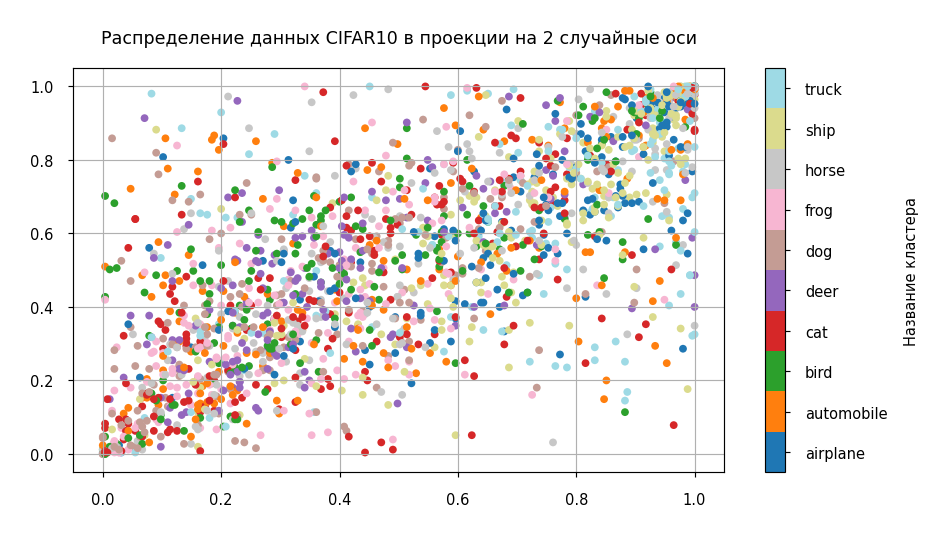

In [55]:
# Если картинка окажется слишком маленькой/большой, то поменяйте image_scale на подходящее значение
plot_interactive(
    cifar10_data_train[:, [17, 64]], cifar10_images_train, cifar10_labels_train,
    cifar10_test_dataset.classes, n_dots=2000, image_scale=0.35
)

Вернёмся в статичный режим отрисовки изображений:

In [56]:
%matplotlib inline
matplotlib.rcParams['figure.dpi'] = 300

#### <font color='DarkOrange'>**Задание 2.1 [кросспроверка, 1 балл][код]**
<a id='task_2.1'></a></font>
Воспользуйтесь алгоритмами снижения размерности `TSNE`, `UMAP`, `Isomap`, `KernelPCA` для визуализации картинок.

Постройте визуализацию низкоразмерного представления, полученного с помощью этих моделей — изобразите четыре графика в одной строке. Во второй строке отобразите результат применения обученных моделей на тестовой выборке. Если для данного алгоритма невозможно сделать предсказания на тестовой выборке — оставьте соответствующий график пустым. Обозначьте разными цветами разные классы объектов. Для повышения производительности можете отобразить только часть выборки на графике ($1000\text{-}2000$ объектов).

<font color='OrangeRed'>**Замечание:**</font>  обратите внимание, что все алгоритмы снижения размерности также требуют правильного масштабирования признаков, для корректной работы и интерпретируемых результатов.

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


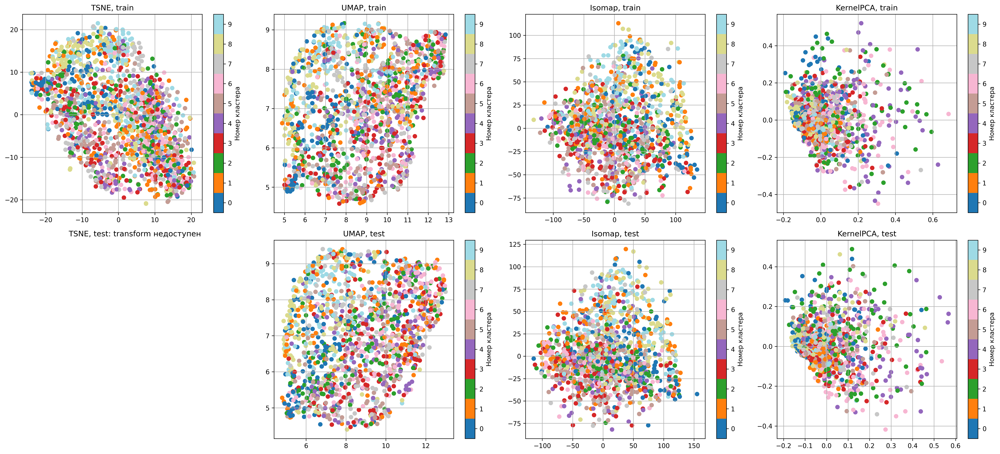

In [68]:
n_objects = 1500

cifar10_data_train_part, _, cifar10_labels_train_part, _ = train_test_split(
    cifar10_data_train,
    cifar10_labels_train,
    train_size=n_objects,
    stratify=cifar10_labels_train,
    random_state=6886
)

cifar10_data_test_part, _, cifar10_labels_test_part, _ = train_test_split(
    cifar10_data_test,
    cifar10_labels_test,
    train_size=n_objects,
    stratify=cifar10_labels_test,
    random_state=6886
)

scaler = StandardScaler()

cifar10_data_train_scaled = scaler.fit_transform(cifar10_data_train_part)
cifar10_data_test_scaled = scaler.transform(cifar10_data_test_part)


tsne_train = TSNE(
    n_components=2,
    perplexity=30,
    learning_rate='auto',
    init='pca',
    random_state=6886
).fit_transform(cifar10_data_train_scaled)

umap_model = UMAP(
    n_components=2,
    n_neighbors=15,
    min_dist=0.1,
    random_state=6886
)
umap_train = umap_model.fit_transform(cifar10_data_train_scaled)
umap_test = umap_model.transform(cifar10_data_test_scaled)

isomap_model = Isomap(
    n_components=2,
    n_neighbors=15
)
isomap_train = isomap_model.fit_transform(cifar10_data_train_scaled)
isomap_test = isomap_model.transform(cifar10_data_test_scaled)

kernel_pca_model = KernelPCA(
    n_components=2,
    kernel='rbf',
    gamma=0.001,
    random_state=6886
)
kernel_pca_train = kernel_pca_model.fit_transform(cifar10_data_train_scaled)
kernel_pca_test = kernel_pca_model.transform(cifar10_data_test_scaled)


fig, axes = plt.subplots(2, 4, figsize=(22, 10))

plot_2d_data(
    tsne_train,
    cifar10_labels_train_part,
    title='TSNE, train',
    ax=axes[0, 0]
)

plot_2d_data(
    umap_train,
    cifar10_labels_train_part,
    title='UMAP, train',
    ax=axes[0, 1]
)

plot_2d_data(
    isomap_train,
    cifar10_labels_train_part,
    title='Isomap, train',
    ax=axes[0, 2]
)

plot_2d_data(
    kernel_pca_train,
    cifar10_labels_train_part,
    title='KernelPCA, train',
    ax=axes[0, 3]
)

axes[1, 0].set_title('TSNE, test: transform недоступен')
axes[1, 0].axis('off')

plot_2d_data(
    umap_test,
    cifar10_labels_test_part,
    title='UMAP, test',
    ax=axes[1, 1]
)

plot_2d_data(
    isomap_test,
    cifar10_labels_test_part,
    title='Isomap, test',
    ax=axes[1, 2]
)

plot_2d_data(
    kernel_pca_test,
    cifar10_labels_test_part,
    title='KernelPCA, test',
    ax=axes[1, 3]
)

fig.tight_layout()
plt.show()

#### <font color='DarkOrange'>**Задание 2.2 [кросспроверка, 1 балл][вопрос]**</font>
Опишите увиденное. Почему алгоритмы могли отработать не так, как вы ожидали?

<font color='MediumOrchid'>**Ваш ответ здесь:**</font> (ｏ・_・)ノ”(ノ_<、):

На графиках классы CIFAR10 разделяются довольно плохо: точки разных классов сильно перемешаны. У t-SNE график для test пустой, потому что стандартная реализация sklearn не умеет применять уже обученный t-SNE к новым объектам через transform

Такой результат ожидаем: исходные признаки — это просто пиксели изображений размерности 3072. В таком пространстве расстояние между объектами не всегда соответствует смысловой похожести картинок. Кроме того, мы сжимаем данные до 2 измерений, поэтому часть структуры теряется, а результат сильно зависит от выбранных гиперпараметров

#### <font color='DarkOrange'>**Задание 2.3 [кросспроверка, 1 балл][вопрос]**</font>
Методы снижения размерности, как и другие метрические методы испытывают трудности при работе с данными высокой размерности. Напишите как минимум две причины, почему.

<font color='MediumOrchid'>**Ваш ответ здесь:**</font> (ｏ・_・)ノ”(ノ_<、):

В высокой размерности расстояния между объектами становятся менее информативными: ближайшие и дальние соседи могут отличаться не так сильно, поэтому метрическим алгоритмам сложнее понять структуру данных

Также в большой размерности часто много лишних или шумовых признаков. Они влияют на расстояния и могут мешать увидеть настоящие зависимости между объектами

Ещё одна проблема — вычисления становятся тяжелее: нужно хранить и считать расстояния между большим числом высокоразмерных объектов

Один из способов решения этих проблем — перейти в другое, более репрезентативное пространство признаков, где объекты будут расположены в многообразии, которое легче представить в двумерном пространстве. Чтобы выполнить такое преобразование воспользуемся типичным подходом **Transfer Learning** — предобученными нейронными сетями. С помощью глубокой сети обученной на другом наборе изображений (`ImageNet`) мы перейдём в новое векторное пространство и затем применим методы снижения размерности.

Так как локальный подсчёт эмбеддингов изображений может занять много времени, Вы можете попробовать скачать их c помощью `gdown`:

In [69]:
gdown.download(id='16UgWo1Emt9ar1O4h2Xxed0ZpJZ0OG5V-', output='cifar10_deep_features.npy')

Downloading...
From (original): https://drive.google.com/uc?id=16UgWo1Emt9ar1O4h2Xxed0ZpJZ0OG5V-
From (redirected): https://drive.google.com/uc?id=16UgWo1Emt9ar1O4h2Xxed0ZpJZ0OG5V-&confirm=t&uuid=fae80d45-d0f5-4162-bafa-17807728d74d
To: /content/cifar10_deep_features.npy
100%|██████████| 164M/164M [00:02<00:00, 56.6MB/s]


'cifar10_deep_features.npy'

In [70]:
FEATURES_PATH = './cifar10_deep_features.npy'

if not os.path.exists(FEATURES_PATH):
    deep_cnn = InceptionV3(weights='imagenet', include_top=False, input_shape=(139, 139, 3))

    cifar10_tensors_test = torch.nn.functional.interpolate(torch.tensor(
        cifar10_images_test.transpose(0, 3, 1, 2)
    ), size=139).numpy().transpose(0, 2, 3, 1).astype(np.float32)
    cifar10_tensors_train = torch.nn.functional.interpolate(torch.tensor(
        cifar10_images_train.transpose(0, 3, 1, 2)
    ), size=139).numpy().transpose(0, 2, 3, 1).astype(np.float32)

    cifar10_deep_features_test = deep_cnn.predict(
        preprocess_input(cifar10_tensors_test)
    ).mean(axis=(1, 2)).reshape([cifar10_tensors_test.shape[0], -1])
    cifar10_deep_features_train = deep_cnn.predict(
        preprocess_input(cifar10_tensors_train)
    ).mean(axis=(1, 2)).reshape([cifar10_tensors_train.shape[0], -1])

    np.save(FEATURES_PATH, [cifar10_deep_features_test, cifar10_deep_features_train])
else:
    cifar10_deep_features_test, cifar10_deep_features_train = np.load(FEATURES_PATH, allow_pickle=True)

#### <font color='DarkOrange'>**Задание 2.4 [кросспроверка, 2 баллa][код]**</font>
Используйте выделенные признаки для обучения алгоритмов из предыдущего пункта. Постройте графики. Замечание из пункта [**2.1**](#task_2.1) остаётся в силе.

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


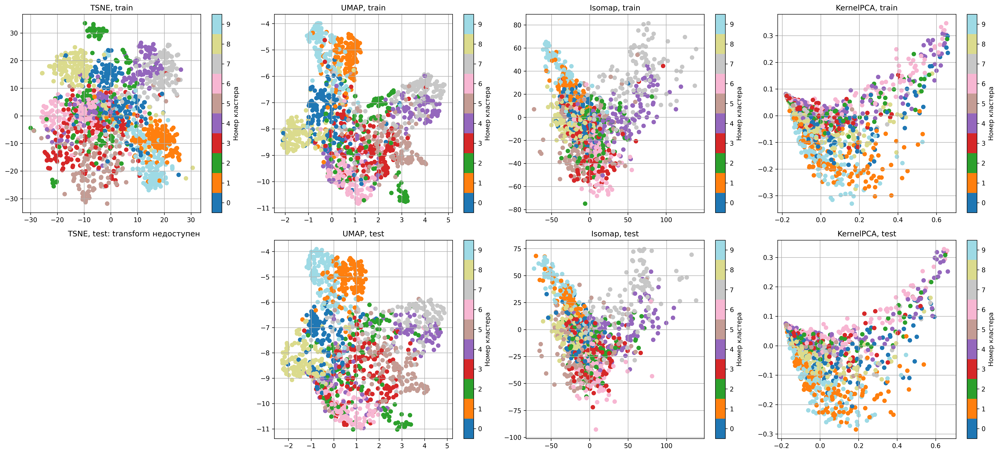

In [71]:
n_objects = 1500

cifar10_deep_train_part, _, cifar10_labels_train_part, _ = train_test_split(
    cifar10_deep_features_train,
    cifar10_labels_train,
    train_size=n_objects,
    stratify=cifar10_labels_train,
    random_state=6886
)

cifar10_deep_test_part, _, cifar10_labels_test_part, _ = train_test_split(
    cifar10_deep_features_test,
    cifar10_labels_test,
    train_size=n_objects,
    stratify=cifar10_labels_test,
    random_state=6886
)

scaler = StandardScaler()

cifar10_deep_train_scaled = scaler.fit_transform(cifar10_deep_train_part)
cifar10_deep_test_scaled = scaler.transform(cifar10_deep_test_part)


tsne_deep_train = TSNE(
    n_components=2,
    perplexity=30,
    learning_rate='auto',
    init='pca',
    random_state=6886
).fit_transform(cifar10_deep_train_scaled)


umap_deep_model = UMAP(
    n_components=2,
    n_neighbors=15,
    min_dist=0.1,
    random_state=6886
)
umap_deep_train = umap_deep_model.fit_transform(cifar10_deep_train_scaled)
umap_deep_test = umap_deep_model.transform(cifar10_deep_test_scaled)


isomap_deep_model = Isomap(
    n_components=2,
    n_neighbors=15
)
isomap_deep_train = isomap_deep_model.fit_transform(cifar10_deep_train_scaled)
isomap_deep_test = isomap_deep_model.transform(cifar10_deep_test_scaled)


kernel_pca_deep_model = KernelPCA(
    n_components=2,
    kernel='rbf',
    gamma=0.001,
    random_state=6886
)
kernel_pca_deep_train = kernel_pca_deep_model.fit_transform(
    cifar10_deep_train_scaled
)
kernel_pca_deep_test = kernel_pca_deep_model.transform(
    cifar10_deep_test_scaled
)


fig, axes = plt.subplots(2, 4, figsize=(22, 10))

plot_2d_data(
    tsne_deep_train,
    cifar10_labels_train_part,
    title='TSNE, train',
    ax=axes[0, 0]
)

plot_2d_data(
    umap_deep_train,
    cifar10_labels_train_part,
    title='UMAP, train',
    ax=axes[0, 1]
)

plot_2d_data(
    isomap_deep_train,
    cifar10_labels_train_part,
    title='Isomap, train',
    ax=axes[0, 2]
)

plot_2d_data(
    kernel_pca_deep_train,
    cifar10_labels_train_part,
    title='KernelPCA, train',
    ax=axes[0, 3]
)

axes[1, 0].set_title('TSNE, test: transform недоступен')
axes[1, 0].axis('off')

plot_2d_data(
    umap_deep_test,
    cifar10_labels_test_part,
    title='UMAP, test',
    ax=axes[1, 1]
)

plot_2d_data(
    isomap_deep_test,
    cifar10_labels_test_part,
    title='Isomap, test',
    ax=axes[1, 2]
)

plot_2d_data(
    kernel_pca_deep_test,
    cifar10_labels_test_part,
    title='KernelPCA, test',
    ax=axes[1, 3]
)

fig.tight_layout()
plt.show()

#### <font color='DarkOrange'>**Задание 2.5 [кросспроверка, 1 балл][вопрос]**</font>
1. Есть ли какие-то изменения по сравнению с использованием исходных признаков?
2. Как вы думаете, почему использование глубоких признаков помогло/не помогло в задаче снижения размерности?
3. Какой алгоритм показал себя лучше на ваш взгляд?
4. Согласованы ли преобразования на обучающей и тестовых выборках? Какие недостатки есть в том, что преобразование на тестовой выборке выглядит отлично от низкоразмерного представления обучающей выборки?
5. Какие из алгоритмов можно использовать в качестве первого шага по снижению размерности в задачах машинного обучения? Какой из них использовали бы вы?

<font color='MediumOrchid'>**Ваш ответ здесь:**</font> (ｏ・_・)ノ”(ノ_<、):

1. Да, изменения заметны: на глубоких признаках классы разделяются лучше, особенно для t-SNE и UMAP. Точки одного класса чаще оказываются рядом, а группы выглядят более осмысленно, чем на сырых пикселях

2. Глубокие признаки помогли, потому что они описывают не отдельные пиксели, а более важные свойства картинки: формы, части объектов, текстуры и т.п. Поэтому расстояния между объектами в таком пространстве лучше отражают реальное сходство изображений

3. Лучше всего, на мой взгляд, показал себя UMAP: группы получаются достаточно понятными, и при этом есть возможность применять обученное преобразование к test

4. Train и test выглядят довольно согласованно: похожие классы попадают примерно в похожие области. Если бы test сильно отличался от train, это было бы плохо, потому что тогда положению новых точек на 2D-графике нельзя было бы особо доверять

5. В качестве первого шага снижения размерности можно использовать UMAP, Isomap или KernelPCA, так как они позволяют получать представления для новых объектов. Я бы выбрал UMAP, потому что он даёт хорошую визуализацию и обычно работает быстрее и стабильнее на таких данных

Далее, для визуализации кластеризации используйте один из методов снижения размерности на ваш выбор и то векторное представление, которое лучше всего себя проявило (исходное или полученное с помощью глубокой сети). Кластеризацию обучайте также на наиболее подходящем высокоразмерном векторном представлении.

#### <font color='DarkOrange'>**Задание 2.6 [кросспроверка, 1 балл][код, вопрос]**</font>
Изобразите выборку CIFAR10 с помощью выбранного алгоритма снижения размерности.

<font color='LightSteelBlue'>**Совет**</font> Изобразите результат с помощью `plot_interactive`, чтобы изучить особенности кластеризации в соответствии с исходными изображениями. Если вы нашли интересные особенности — напишите про это.

In [111]:
%matplotlib ipympl
matplotlib.rcParams['figure.dpi'] = 300

# Для работы в Google Colab нужно выполнить специфичную магию
# Обычно, она не срабатывает с первого раза, поэтому может потребоваться
#   несколько раз выполнить ячейку и несколько раз попробовать нарисовать график
try:
    from google.colab import output
    output.enable_custom_widget_manager()
except:
    pass

ValueError: Key backend: 'module://ipympl.backend_nbagg' is not a valid value for backend; supported values are ['gtk3agg', 'gtk3cairo', 'gtk4agg', 'gtk4cairo', 'macosx', 'nbagg', 'notebook', 'qtagg', 'qtcairo', 'qt5agg', 'qt5cairo', 'tkagg', 'tkcairo', 'webagg', 'wx', 'wxagg', 'wxcairo', 'agg', 'cairo', 'pdf', 'pgf', 'ps', 'svg', 'template', 'inline']

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


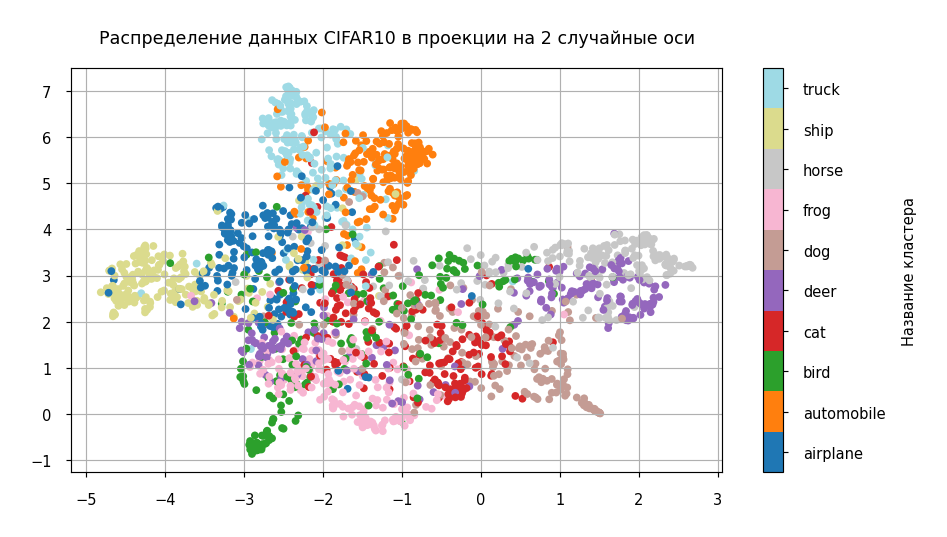

In [112]:
n_objects = 2000

selected_indices, _ = train_test_split(
    np.arange(cifar10_deep_features_train.shape[0]),
    train_size=n_objects,
    stratify=cifar10_labels_train,
    random_state=6886
)

cifar10_deep_features_part = cifar10_deep_features_train[selected_indices]
cifar10_images_part = cifar10_images_train[selected_indices]
cifar10_labels_part = cifar10_labels_train[selected_indices]

scaler = StandardScaler()
cifar10_deep_features_part_scaled = scaler.fit_transform(
    cifar10_deep_features_part
)

umap_interactive_model = UMAP(
    n_components=2,
    n_neighbors=15,
    min_dist=0.1,
    random_state=6886
)

umap_interactive_data = umap_interactive_model.fit_transform(
    cifar10_deep_features_part_scaled
)

plot_interactive(
    umap_interactive_data,
    cifar10_images_part,
    cifar10_labels_part,
    cifar10_train_dataset.classes,
    n_dots=2000,
    image_scale=0.35
)

Вернёмся в статичный режим отрисовки изображений:

In [113]:
%matplotlib inline
matplotlib.rcParams['figure.dpi'] = 300

Теперь, когда мы можем визуализировать кластеризацию, можно сравнить алгоритмы из первой части на естественных данных.

#### <font color='DarkOrange'>**Задание 2.7 [кросспроверка, 1.5 балла][код]**</font>
Подберите параметры `KMeans`, `DBSCAN`, `AgglomerativeClustering` используя силуэт и B-Cubed. Визуализируйте получившиеся кластеризации также, как и в задании **1.с.4** в ноутбуке [Base] Clusterizartion. Для ускорения перебора можете производить его на небольшой доле от всех объектов ($1000\text{-}2000$ объектов).

*Замечание:* Алгоритмы кластеризации нужно применять к исходному векторному представлению. Снижение размерности используется только для визуализации.

In [115]:
n_objects = 2000

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


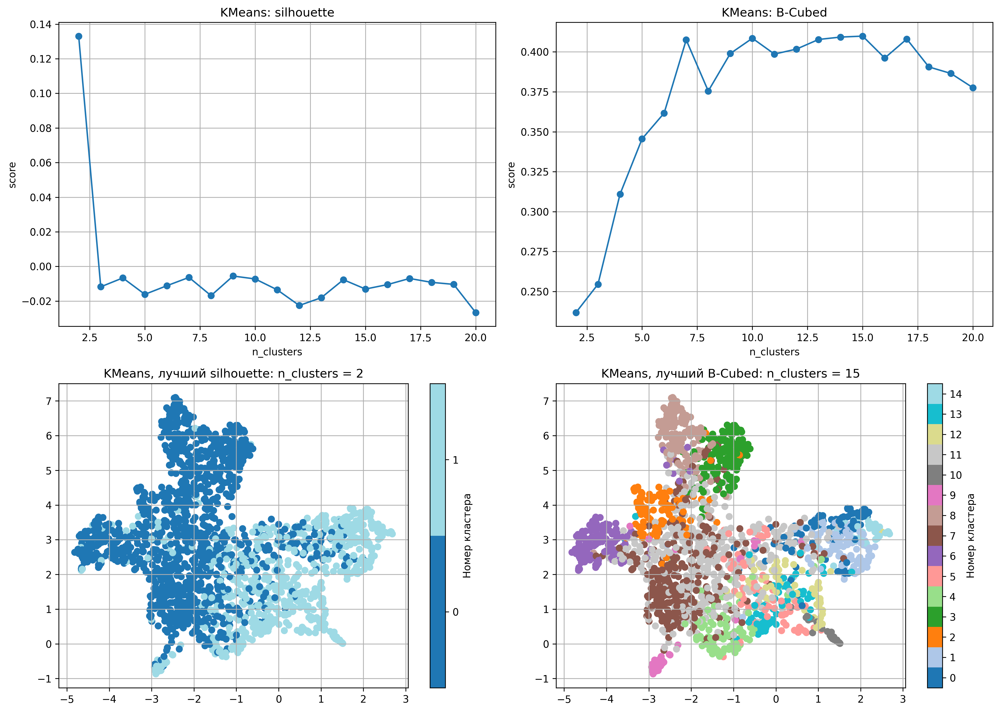

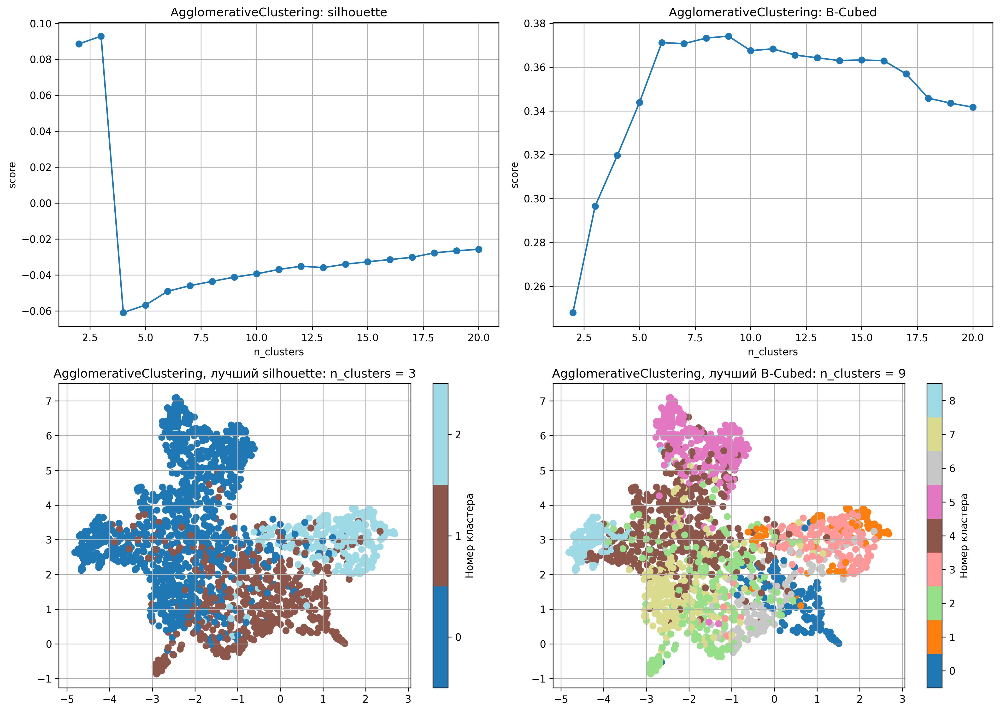

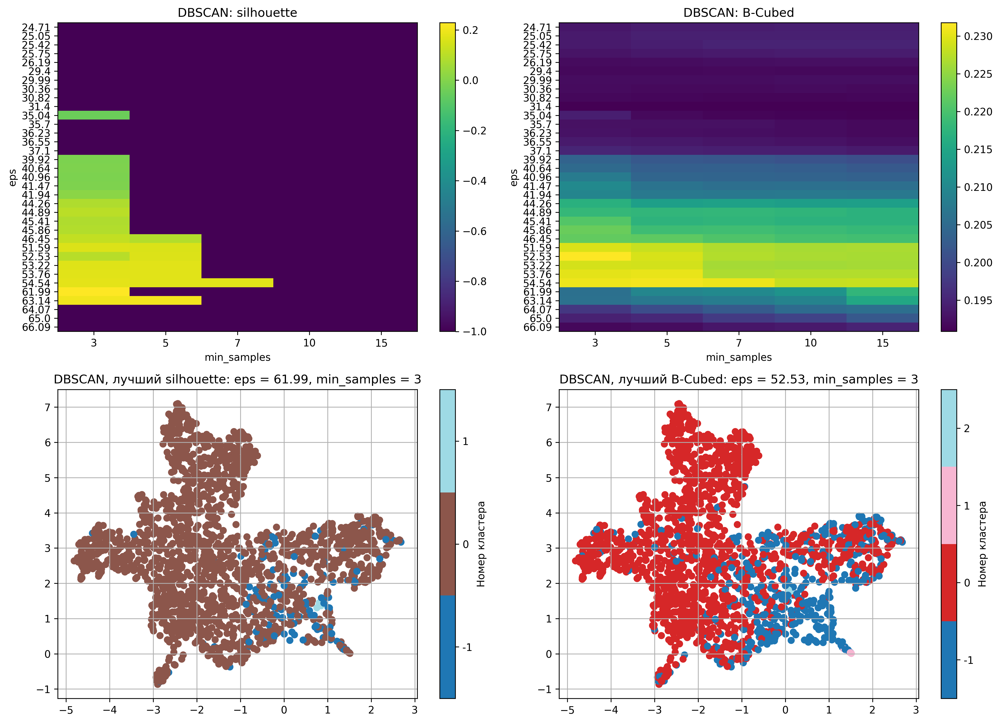

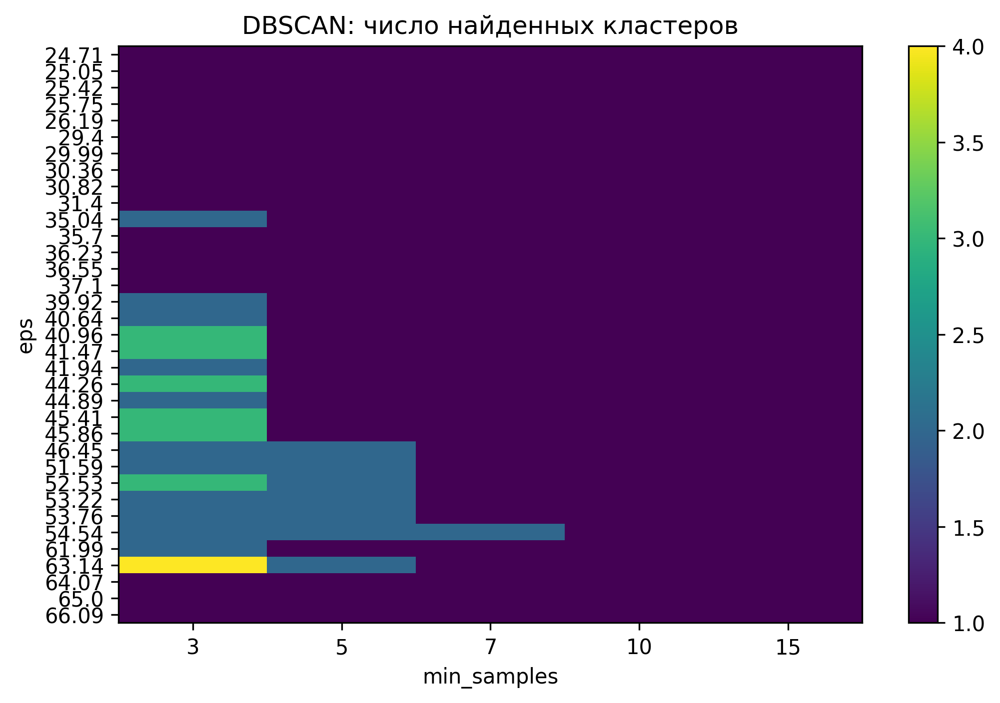

KMeans:
best silhouette n_clusters = 2
best B-Cubed n_clusters = 15

AgglomerativeClustering:
best silhouette n_clusters = 3
best B-Cubed n_clusters = 9

DBSCAN:
best silhouette eps = 61.99 min_samples = 3
best B-Cubed eps = 52.53 min_samples = 3

eps_grid = [24.71 25.05 25.42 25.75 26.19 29.4  29.99 30.36 30.82 31.4  35.04 35.7
 36.23 36.55 37.1  39.92 40.64 40.96 41.47 41.94 44.26 44.89 45.41 45.86
 46.45 51.59 52.53 53.22 53.76 54.54 61.99 63.14 64.07 65.   66.09]
min_samples_grid = [ 3  5  7 10 15]


In [116]:
selected_indices, _ = train_test_split(
    np.arange(cifar10_deep_features_train.shape[0]),
    train_size=n_objects,
    stratify=cifar10_labels_train,
    random_state=6886
)

cifar10_features_part = cifar10_deep_features_train[selected_indices]
cifar10_labels_part = cifar10_labels_train[selected_indices]

scaler = StandardScaler()
cifar10_features_scaled = scaler.fit_transform(cifar10_features_part)

umap_for_visualization = UMAP(
    n_components=2,
    n_neighbors=15,
    min_dist=0.1,
    random_state=6886
)

cifar10_features_2d = umap_for_visualization.fit_transform(
    cifar10_features_scaled
)


def get_scores(cluster_labels):
    return (
        silhouette_score(cifar10_features_scaled, cluster_labels),
        bcubed_score(cifar10_labels_part, cluster_labels)
    )


n_clusters_grid = np.arange(2, 21)

kmeans_silhouette_scores = []
kmeans_bcubed_scores = []

for n_clusters in n_clusters_grid:
    cluster_labels = KMeans(
        n_clusters=n_clusters,
        random_state=6886,
        n_init=10
    ).fit_predict(cifar10_features_scaled)

    sil, bcubed = get_scores(cluster_labels)
    kmeans_silhouette_scores.append(sil)
    kmeans_bcubed_scores.append(bcubed)

kmeans_silhouette_scores = np.array(kmeans_silhouette_scores)
kmeans_bcubed_scores = np.array(kmeans_bcubed_scores)

best_kmeans_silhouette = n_clusters_grid[
    np.argmax(kmeans_silhouette_scores)
]
best_kmeans_bcubed = n_clusters_grid[
    np.argmax(kmeans_bcubed_scores)
]

kmeans_labels_silhouette = KMeans(
    n_clusters=best_kmeans_silhouette,
    random_state=6886,
    n_init=10
).fit_predict(cifar10_features_scaled)

kmeans_labels_bcubed = KMeans(
    n_clusters=best_kmeans_bcubed,
    random_state=6886,
    n_init=10
).fit_predict(cifar10_features_scaled)


fig, axes = plt.subplots(2, 2, figsize=(14, 10))

axes[0, 0].plot(n_clusters_grid, kmeans_silhouette_scores, marker='o')
axes[0, 0].set_title('KMeans: silhouette')
axes[0, 0].set_xlabel('n_clusters')
axes[0, 0].set_ylabel('score')
axes[0, 0].grid(True)

axes[0, 1].plot(n_clusters_grid, kmeans_bcubed_scores, marker='o')
axes[0, 1].set_title('KMeans: B-Cubed')
axes[0, 1].set_xlabel('n_clusters')
axes[0, 1].set_ylabel('score')
axes[0, 1].grid(True)

plot_2d_data(
    cifar10_features_2d,
    kmeans_labels_silhouette,
    title=f'KMeans, лучший silhouette: n_clusters = {best_kmeans_silhouette}',
    ax=axes[1, 0]
)

plot_2d_data(
    cifar10_features_2d,
    kmeans_labels_bcubed,
    title=f'KMeans, лучший B-Cubed: n_clusters = {best_kmeans_bcubed}',
    ax=axes[1, 1]
)

fig.tight_layout()
plt.show()


agglomerative_silhouette_scores = []
agglomerative_bcubed_scores = []

for n_clusters in n_clusters_grid:
    cluster_labels = AgglomerativeClustering(
        n_clusters=n_clusters,
        linkage='ward'
    ).fit_predict(cifar10_features_scaled)

    sil, bcubed = get_scores(cluster_labels)
    agglomerative_silhouette_scores.append(sil)
    agglomerative_bcubed_scores.append(bcubed)

agglomerative_silhouette_scores = np.array(agglomerative_silhouette_scores)
agglomerative_bcubed_scores = np.array(agglomerative_bcubed_scores)

best_agglomerative_silhouette = n_clusters_grid[
    np.argmax(agglomerative_silhouette_scores)
]
best_agglomerative_bcubed = n_clusters_grid[
    np.argmax(agglomerative_bcubed_scores)
]

agglomerative_labels_silhouette = AgglomerativeClustering(
    n_clusters=best_agglomerative_silhouette,
    linkage='ward'
).fit_predict(cifar10_features_scaled)

agglomerative_labels_bcubed = AgglomerativeClustering(
    n_clusters=best_agglomerative_bcubed,
    linkage='ward'
).fit_predict(cifar10_features_scaled)


fig, axes = plt.subplots(2, 2, figsize=(14, 10))

axes[0, 0].plot(
    n_clusters_grid,
    agglomerative_silhouette_scores,
    marker='o'
)
axes[0, 0].set_title('AgglomerativeClustering: silhouette')
axes[0, 0].set_xlabel('n_clusters')
axes[0, 0].set_ylabel('score')
axes[0, 0].grid(True)

axes[0, 1].plot(
    n_clusters_grid,
    agglomerative_bcubed_scores,
    marker='o'
)
axes[0, 1].set_title('AgglomerativeClustering: B-Cubed')
axes[0, 1].set_xlabel('n_clusters')
axes[0, 1].set_ylabel('score')
axes[0, 1].grid(True)

plot_2d_data(
    cifar10_features_2d,
    agglomerative_labels_silhouette,
    title=(
        'AgglomerativeClustering, лучший silhouette: '
        f'n_clusters = {best_agglomerative_silhouette}'
    ),
    ax=axes[1, 0]
)

plot_2d_data(
    cifar10_features_2d,
    agglomerative_labels_bcubed,
    title=(
        'AgglomerativeClustering, лучший B-Cubed: '
        f'n_clusters = {best_agglomerative_bcubed}'
    ),
    ax=axes[1, 1]
)

fig.tight_layout()
plt.show()


min_samples_grid = np.array([3, 5, 7, 10, 15])

distances = sklearn.metrics.pairwise_distances(cifar10_features_scaled)
sorted_distances = np.sort(distances, axis=1)

eps_candidates = []

for min_samples in min_samples_grid:
    kth_distances = sorted_distances[:, min_samples]
    eps_candidates.extend(
        np.quantile(
            kth_distances,
            [0.05, 0.1, 0.2, 0.35, 0.5, 0.7, 0.9]
        )
    )

eps_grid = np.unique(np.round(eps_candidates, 2))

dbscan_silhouette_scores = np.full(
    (len(eps_grid), len(min_samples_grid)),
    -1.0
)
dbscan_bcubed_scores = np.zeros(
    (len(eps_grid), len(min_samples_grid))
)
dbscan_n_clusters = np.zeros(
    (len(eps_grid), len(min_samples_grid)),
    dtype=int
)

for i, eps in enumerate(eps_grid):
    for j, min_samples in enumerate(min_samples_grid):
        cluster_labels = DBSCAN(
            eps=eps,
            min_samples=min_samples
        ).fit_predict(cifar10_features_scaled)

        unique_labels = np.unique(cluster_labels)
        n_clusters_found = len(unique_labels) - int(-1 in unique_labels)
        dbscan_n_clusters[i, j] = n_clusters_found

        if n_clusters_found >= 2:
            dbscan_silhouette_scores[i, j] = silhouette_score(
                cifar10_features_scaled,
                cluster_labels
            )

        dbscan_bcubed_scores[i, j] = bcubed_score(
            cifar10_labels_part,
            cluster_labels
        )

best_dbscan_silhouette_index = np.unravel_index(
    np.argmax(dbscan_silhouette_scores),
    dbscan_silhouette_scores.shape
)
best_dbscan_bcubed_index = np.unravel_index(
    np.argmax(dbscan_bcubed_scores),
    dbscan_bcubed_scores.shape
)

best_dbscan_silhouette_eps = eps_grid[best_dbscan_silhouette_index[0]]
best_dbscan_silhouette_min_samples = min_samples_grid[
    best_dbscan_silhouette_index[1]
]

best_dbscan_bcubed_eps = eps_grid[best_dbscan_bcubed_index[0]]
best_dbscan_bcubed_min_samples = min_samples_grid[
    best_dbscan_bcubed_index[1]
]

dbscan_labels_silhouette = DBSCAN(
    eps=best_dbscan_silhouette_eps,
    min_samples=best_dbscan_silhouette_min_samples
).fit_predict(cifar10_features_scaled)

dbscan_labels_bcubed = DBSCAN(
    eps=best_dbscan_bcubed_eps,
    min_samples=best_dbscan_bcubed_min_samples
).fit_predict(cifar10_features_scaled)


fig, axes = plt.subplots(2, 2, figsize=(14, 10))

image = axes[0, 0].imshow(
    dbscan_silhouette_scores,
    aspect='auto'
)
axes[0, 0].set_title('DBSCAN: silhouette')
axes[0, 0].set_xlabel('min_samples')
axes[0, 0].set_ylabel('eps')
axes[0, 0].set_xticks(np.arange(len(min_samples_grid)))
axes[0, 0].set_xticklabels(min_samples_grid)
axes[0, 0].set_yticks(np.arange(len(eps_grid)))
axes[0, 0].set_yticklabels(eps_grid)
fig.colorbar(image, ax=axes[0, 0])

image = axes[0, 1].imshow(
    dbscan_bcubed_scores,
    aspect='auto'
)
axes[0, 1].set_title('DBSCAN: B-Cubed')
axes[0, 1].set_xlabel('min_samples')
axes[0, 1].set_ylabel('eps')
axes[0, 1].set_xticks(np.arange(len(min_samples_grid)))
axes[0, 1].set_xticklabels(min_samples_grid)
axes[0, 1].set_yticks(np.arange(len(eps_grid)))
axes[0, 1].set_yticklabels(eps_grid)
fig.colorbar(image, ax=axes[0, 1])

plot_2d_data(
    cifar10_features_2d,
    dbscan_labels_silhouette,
    title=(
        'DBSCAN, лучший silhouette: '
        f'eps = {best_dbscan_silhouette_eps:.2f}, '
        f'min_samples = {best_dbscan_silhouette_min_samples}'
    ),
    ax=axes[1, 0]
)

plot_2d_data(
    cifar10_features_2d,
    dbscan_labels_bcubed,
    title=(
        'DBSCAN, лучший B-Cubed: '
        f'eps = {best_dbscan_bcubed_eps:.2f}, '
        f'min_samples = {best_dbscan_bcubed_min_samples}'
    ),
    ax=axes[1, 1]
)

fig.tight_layout()
plt.show()


fig, ax = plt.subplots(figsize=(8, 5))

image = ax.imshow(
    dbscan_n_clusters,
    aspect='auto'
)
ax.set_title('DBSCAN: число найденных кластеров')
ax.set_xlabel('min_samples')
ax.set_ylabel('eps')
ax.set_xticks(np.arange(len(min_samples_grid)))
ax.set_xticklabels(min_samples_grid)
ax.set_yticks(np.arange(len(eps_grid)))
ax.set_yticklabels(eps_grid)
fig.colorbar(image, ax=ax)

plt.show()


print('KMeans:')
print('best silhouette n_clusters =', best_kmeans_silhouette)
print('best B-Cubed n_clusters =', best_kmeans_bcubed)

print()

print('AgglomerativeClustering:')
print('best silhouette n_clusters =', best_agglomerative_silhouette)
print('best B-Cubed n_clusters =', best_agglomerative_bcubed)

print()

print('DBSCAN:')
print(
    'best silhouette eps =',
    best_dbscan_silhouette_eps,
    'min_samples =',
    best_dbscan_silhouette_min_samples
)
print(
    'best B-Cubed eps =',
    best_dbscan_bcubed_eps,
    'min_samples =',
    best_dbscan_bcubed_min_samples
)

print()

print('eps_grid =', eps_grid)
print('min_samples_grid =', min_samples_grid)

#### <font color='DarkOrange'>**Задание 2.8 [кросспроверка, 1 балл][вопрос]** </font>
1. Какие алгоритмы справились с кластеризацией естественных данных?
2. Получилось ли подобрать оптимальное число кластеров с помощью BCubed и коэффициента силуэта?
3. Объясните почему коэффициент силуэта не позволил выполнить подбор оптимальных гиперпараметров.

<font color='MediumOrchid'>**Ваш ответ здесь:**</font> (ｏ・_・)ノ”(ノ_<、):

Лучше всего с кластеризацией справились KMeans и AgglomerativeClustering, но результат всё равно не идеальный: CIFAR10 — сложные естественные изображения, и классы не всегда хорошо отделяются простыми кластерами

B-Cubed дал более осмысленные параметры, потому что он использует настоящие метки классов. Например, для KMeans он выбрал больше кластеров, что ближе к реальной структуре данных. Silhouette же выбрал слишком маленькое число кластеров: 2 для KMeans и 3 для AgglomerativeClustering

Коэффициент силуэта плохо подходит здесь для выбора числа кластеров, потому что он оценивает только компактность и расстояния между кластерами, не зная истинных классов. На естественных данных большие классы могут быть размытыми и неоднородными, поэтому silhouette часто предпочитает грубое разбиение на несколько крупных и компактных групп, а не реальные 10 классов CIFAR10

Интересный способ визуализации Иерархической кластеризации — построение дендрограммы. Такой способ визуализации позволяет анализировать, как именно связаны между собой объекты, подбирать оптимальное число кластеров, а также определять, какие классы отделяются "хорошо" от других классов, а какие классы перемешаны в одном кластере.

In [117]:
def plot_dendrogram(model, labels, classes, ax):
    n_classes = len(classes)
    n_samples = len(model.labels_)
    n_u_connections = model.children_.shape[0]
    colors = plt.get_cmap('tab20', n_classes).colors

    bin_counts = np.zeros([n_u_connections, n_classes])
    for i, merge in enumerate(model.children_):
        current_bin_count = np.zeros(n_classes)
        for child_idx in merge:
            if child_idx < n_samples:
                current_bin_count[labels[child_idx]] += 1
            else:
                current_bin_count += bin_counts[child_idx - n_samples]

        bin_counts[i] = current_bin_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, np.sum(bin_counts, axis=1)]
    ).astype(float)

    def leaf_label_func(idx):
        if idx < len(labels):
            return None
        else:
            ratio = 100 * np.max(bin_counts[idx - n_samples]) / np.sum(bin_counts[idx - n_samples])
            if ratio < 100:
                return '{0:.0f}%'.format(ratio)
            else:
                return None

    def link_color_func(idx):
        mode_class = np.argmax(bin_counts[idx - n_samples])
        return matplotlib.colors.to_hex(colors[mode_class], keep_alpha=True)

    scipy.cluster.hierarchy.dendrogram(
        linkage_matrix, ax=ax, link_color_func=link_color_func, leaf_label_func=leaf_label_func,
        orientation='right', truncate_mode="level", p=9
    )

    for idx, class_name in enumerate(classes):
        ax.plot([], [], c=matplotlib.colors.to_hex(colors[idx], keep_alpha=True), label=class_name)
    ax.legend()

    # Удалим накладывающиеся метки
    threshold = 55
    prev_position = -(threshold + 1)

    y_labels = ax.get_yaxis().get_ticklabels()
    for label in y_labels:
        if label.get_text() == '':
            continue

        _, position = label.get_position()
        if position - prev_position < threshold:
            label.set_text('')
        else:
            prev_position = position
    ax.get_yaxis().set_ticklabels(y_labels)

    ax.set_xlabel('Расстояние между кластерами')
    ax.set_ylabel('Доля объектов наибольшего класса в данном кластере')

    ax.set_title('Дендрограмма Иерархической Кластеризации')

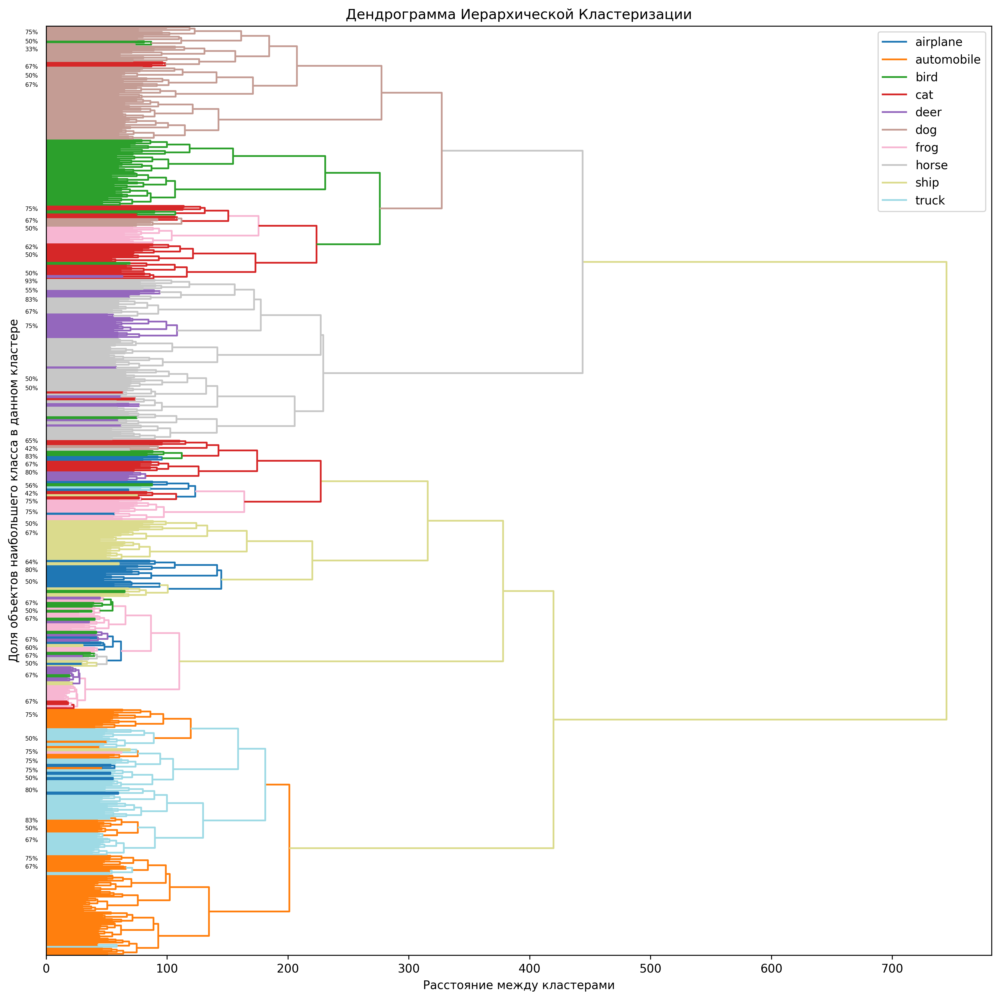

In [118]:
n_objects = 2000
model = AgglomerativeClustering(
    n_clusters=None, distance_threshold=0.0, compute_distances=True, compute_full_tree=True
)
model = model.fit(cifar10_deep_features_train[:n_objects])

fig, ax = plt.subplots(1, 1, figsize=(12, 12))

plot_dendrogram(
    model,
    labels=cifar10_labels_train[:n_objects],
    classes=cifar10_train_dataset.classes,
    ax=ax
)

fig.tight_layout()
plt.show()

#### <font color='DarkOrange'>**Задание 2.9 [кросспроверка, 0.5 балла][вопрос]** </font>

Проанализируйте получившуюся дендрограмму. Напишите свои наблюдения ниже.

<font color='MediumOrchid'>**Ваш ответ здесь:**</font> (ｏ・_・)ノ”(ノ_<、):

На дендрограмме видно, что на малых расстояниях происходит много слияний похожих объектов, часто внутри одного класса. Некоторые классы образуют достаточно крупные ветви, то есть их объекты в пространстве признаков действительно находятся ближе друг к другу

При этом ветви не полностью чистые: внутри них встречаются объекты других классов. Это нормально для CIFAR10, потому что картинки разных классов могут быть визуально похожи. В целом дендрограмма показывает иерархию: сначала объединяются самые похожие объекты, затем небольшие группы сливаются в более крупные и менее чистые кластеры